# TD-PSOLA
 - https://github.com/sannawag/TD-PSOLA
 - https://courses.engr.illinois.edu/ece420/sp2022/lab5/lab/

The description is very detail, including principle and example.

Since it works on cycle by cycle basis, the limitation would be how to robustly estimate `h(t)` of each fundamental period of the signal. also it didn't handle consonant.

In [50]:
from scipy.fft import fft, ifft, fftfreq
from scipy import signal
import numpy as np
import IPython
import matplotlib.pyplot as plt
from vscode_audio import Audio
from lpc_helper import *
%matplotlib inline

def spman_stretch(Xf, ratio = 0.5):
    N = len(Xf)//2
    if (ratio < 1):
        Xfn = Xf[:int(N*ratio)+1]
    else:
        Xfn = np.append(Xf[:N+1], np.zeros(int(N*(ratio-1))))
    Xfn[-1] = np.abs(Xfn[-1])
    return np.append(Xfn, np.conjugate(Xfn[-2:0:-1]))

## Experiment

The principle is quite straightforward. following code illustrate the basic idea.

/home/hddl/lpc_vocoder/lpc_helper.py:55: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sr, wave = scipy.io.wavfile.read(fname)
/home/hddl/lpc_vocoder/lpc_helper.py:55: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  sr, wave = scipy.io.wavfile.read(fname)


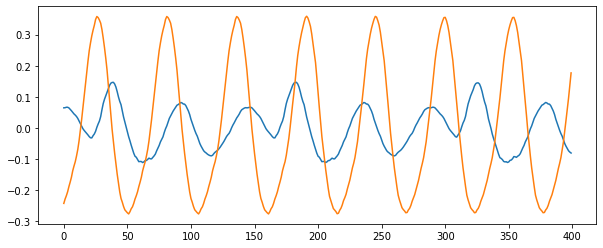

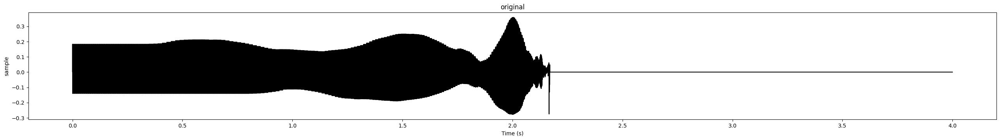

In [51]:
sr = 44100
x = load_wave("wavs/female_scale.wav")
start = int(sr*0.3) + 19
h = x[start:start+196,0]
hw = np.ones(h.shape)

y = np.zeros(sr*4)
i=0
step=len(h)
while(i<sr*3 and step > 10):
    y[i:i+len(h)] += h
    i+=int(step)
    step -= 0.2

plt.figure(figsize=(10,4))
plt.plot(y[sr:sr+400], "-", label="x1")
plt.plot(y[sr*2:sr*2+400], "-", label="x2")

play_sound(y, rate=sr, name="original", spectrum=-1, waveform=1)

## Analyze in frequency domain

/home/hddl/lpc_vocoder/lpc_helper.py:55: WavFileWarning: Chunk (non-data) not understood, skipping it.
  sr, wave = scipy.io.wavfile.read(fname)
/home/hddl/lpc_vocoder/lpc_helper.py:55: WavFileWarning: Incomplete chunk ID: b'\x00', ignoring it.
  sr, wave = scipy.io.wavfile.read(fname)


(661500,)


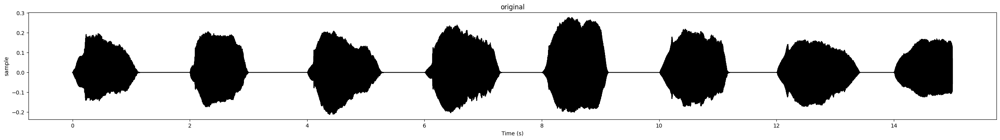

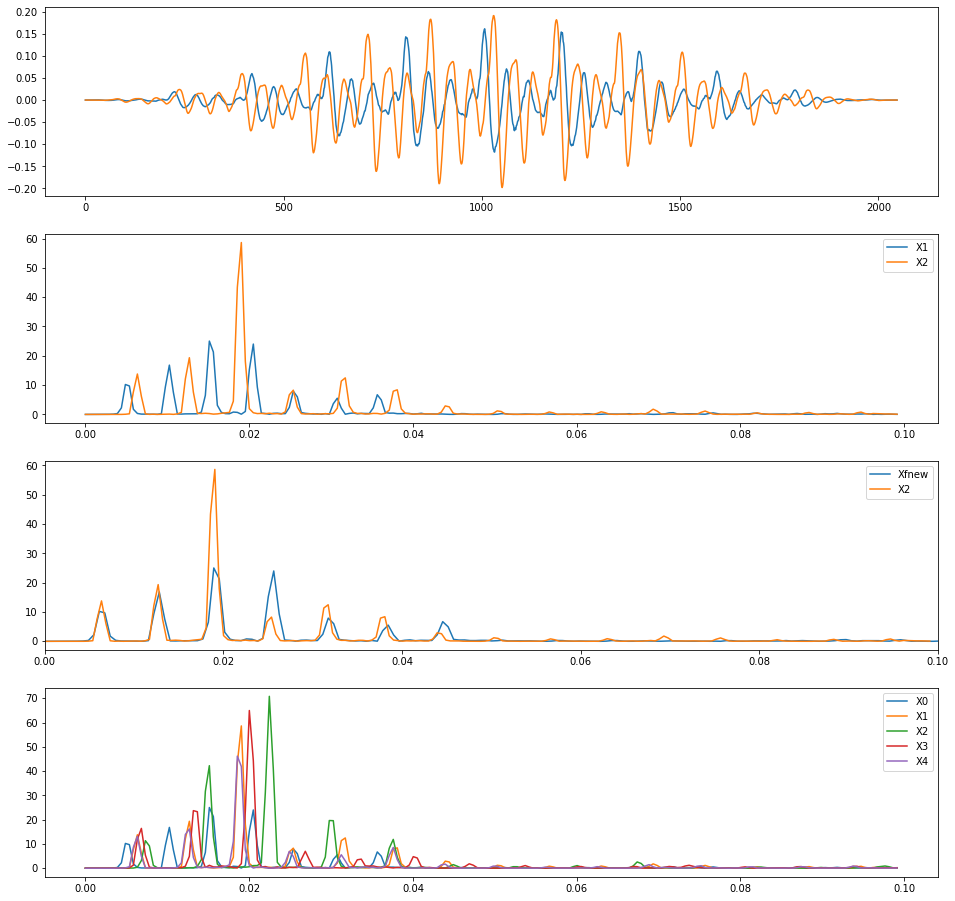

In [52]:
sr = 44100
x = load_wave("wavs/female_scale.wav")[:sr*15,0]

print(x.shape)
play_sound(x, rate=sr, name="original", spectrum=-1, waveform=1)

def stft(x, start, N):
    wnd = scipy.signal.windows.hann(N)
    s = int(sr*start)
    input = x[s:s+N] * wnd
    X = fft(input)
    f = fftfreq(len(X))[:len(X)//10]
    return f, X, input

plt.figure(figsize=(16,16))

f1, X1, x1 = stft(x, 0.5, 2048)
f2, X2, x2 = stft(x, 4.4, 2048)

plt.subplot(411)
plt.plot(x1, "-", label="x1")
plt.plot(x2, "-", label="x2")

plt.subplot(412)
plt.plot(f1, np.abs(X1)[:len(f1)], "-", label="X1")
plt.plot(f2, np.abs(X2)[:len(f2)], "-", label="X2")
plt.legend()

plt.subplot(413)

Xfnew = spman_stretch(X1, 0.8)
fn = fftfreq(len(Xfnew))[:len(Xfnew)//2]

plt.plot(fn, np.abs(Xfnew)[:len(fn)], "-", label="Xfnew")
plt.plot(f2, np.abs(X2)[:len(f2)], "-", label="X2")
plt.xlim(0, 0.1)
plt.legend()

plt.subplot(414)
for i, d in enumerate([0.5, 4.4, 8.5, 10.5, 12.7]):
    f, X, _ = stft(x, d, 2048)
    plt.plot(f, np.abs(X)[:len(f)], "-", label="X{}".format(i))

plt.legend()
